# 0 导入包和函数

In [3]:
!conda info -e

# conda environments:
#
Yolov5                   C:\Users\26613\.conda\envs\Yolov5
base                     D:\anaconda
CS231n                   D:\anaconda\envs\CS231n
IOU                      D:\anaconda\envs\IOU
ISTDU                    D:\anaconda\envs\ISTDU
PP                       D:\anaconda\envs\PP
Pytorch                  D:\anaconda\envs\Pytorch
RecognizeSound           D:\anaconda\envs\RecognizeSound
Tensorflow2              D:\anaconda\envs\Tensorflow2
Try                      D:\anaconda\envs\Try
anti_uav                 D:\anaconda\envs\anti_uav
d2l                      D:\anaconda\envs\d2l
labelimg                 D:\anaconda\envs\labelimg
obbdetection             D:\anaconda\envs\obbdetection
pytorchYOLO              D:\anaconda\envs\pytorchYOLO
wjy                   *  D:\anaconda\envs\wjy



In [2]:
# colab专用
!pip install rdkit

In [1]:
import os
import random

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn as nn


from matplotlib import gridspec

import openpyxl

from rdkit import Chem, DataStructs
from rdkit.Chem.Fingerprints import FingerprintMols
from rdkit.Chem import Draw, AllChem

from scipy.cluster.hierarchy import dendrogram, linkage

from sklearn.model_selection import KFold

from sklearn.metrics import roc_curve, auc
import re
import json

In [ ]:
# colab
from google.colab import drive
drive.mount('/content/drive')

google_dir = r'drive/My Drive'

cjy_path = r'/content/drive/MyDrive/cjy'

In [152]:
cjy_path = r'./'
os.listdir(cjy_path)

['.idea',
 'cjy.ipynb',
 'cjy_2023_12_1.ipynb',
 'cjy_backup.ipynb',
 'cjy_fast.ipynb',
 'cjy_fast_new.ipynb',
 'cjy_finally.ipynb',
 'cjy_ori.ipynb',
 'cjy_train.ipynb',
 'codebackup',
 'datas',
 'inputs',
 'non_DDI_pair.xlsx',
 'SS_0.xlsx',
 'SS_1.xlsx',
 'temp']

# 1 准备数据

1.2 读取 SMILES

In [126]:
path_smiles = os.path.join(cjy_path,'datas/v3/SMILES.xlsx')

df = pd.read_excel(path_smiles)
# df['ID'] = df['DrugBank ID'].map(lambda x:int(x[2:]))
df['mol'] = df['SMILES'].map(lambda x:Chem.MolFromSmiles(x)) # 获得所有药物的mol
df = df[df['mol'].map(lambda x: x is not None)] # 清楚无法计算mol的药物
df.reset_index(drop=True,inplace=True) # 更新序号

[20:18:27] Explicit valence for atom # 13 Cl, 5, is greater than permitted
[20:18:27] SMILES Parse Error: syntax error while parsing: OS(O)(O)C1=CC=C(C=C1)C-1=C2\C=CC(=N2)\C(=C2/N\C(\C=C2)=C(/C2=N/C(/C=C2)=C(\C2=CC=C\-1N2)C1=CC=C(C=C1)S(O)(O)O)C1=CC=C(C=C1)S([O-])([O-])[O-])\C1=CC=C(C=C1)S(O)(O)[O-]
[20:18:27] SMILES Parse Error: Failed parsing SMILES 'OS(O)(O)C1=CC=C(C=C1)C-1=C2\C=CC(=N2)\C(=C2/N\C(\C=C2)=C(/C2=N/C(/C=C2)=C(\C2=CC=C\-1N2)C1=CC=C(C=C1)S(O)(O)O)C1=CC=C(C=C1)S([O-])([O-])[O-])\C1=CC=C(C=C1)S(O)(O)[O-]' for input: 'OS(O)(O)C1=CC=C(C=C1)C-1=C2\C=CC(=N2)\C(=C2/N\C(\C=C2)=C(/C2=N/C(/C=C2)=C(\C2=CC=C\-1N2)C1=CC=C(C=C1)S(O)(O)O)C1=CC=C(C=C1)S([O-])([O-])[O-])\C1=CC=C(C=C1)S(O)(O)[O-]'
[20:18:27] Explicit valence for atom # 19 O, 3, is greater than permitted
[20:18:27] Explicit valence for atom # 0 O, 3, is greater than permitted
[20:18:27] Unusual charge on atom 0 number of radical electrons set to zero
[20:18:27] Explicit valence for atom # 4 F, 2, is greater than permitted
[

In [67]:
# 存储SMILES库中分子化简后的结果
Name_easy_ori = dict(zip( [x.replace(' ','').replace('（','(').replace('）',')').lower() for x in list(df['Name'].values)], list(df['Name'].values) ))
Name_ori_easy = dict(zip(list(Name_easy_ori.values()),list(Name_easy_ori.keys())))

In [245]:
Smiles_ID_all = [int(x[2:]) for x in df['DrugBank ID']]
# Smiles_ID_all = [x.lower() for x in df['DrugBank ID']]

Smiles_Name_all = [x.lower().replace(' ','').replace('（','(').replace('）',')') for x in df['Name']]

ID_In_Smiles = np.zeros(99999,dtype=np.int)

ID_In_Smiles[Smiles_ID_all] = 1
# ID_In_Smiles[[int(x[2:]) for x in Smiles_ID_all]] = 1

C:\Users\26613\AppData\Local\Temp\ipykernel_42940\2754269619.py:6: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  ID_In_Smiles = np.zeros(99999,dtype=np.int)


In [176]:
len(Smiles_Name_all),len(Smiles_ID_all)

(11572, 11572)

In [244]:
# Name_to_ID = dict( zip(list(Name_easy_ori.keys()) , [int(x[2:]) for x in df['DrugBank ID']]) )
Name_to_ID = dict( zip(list(Name_easy_ori.keys()) , [x.lower() for x in df['DrugBank ID']]) )

ID_to_Name = [None for _ in range(99999)]
for index, x in enumerate(Smiles_ID_all):
    ID_to_Name[x] = Smiles_Name_all[index]

In [246]:
# rdkitDatas = [df['mol'][i].SetProp('_Name',df['Name'][i]) for i in range(len(df))]
rdkitDatas = [None for _ in range(len(df))]
for i in range(len(df)):
    try:
        df['mol'][i].SetProp('_Name',df['Name'][i])
        rdkitDatas[i] = df['mol'][i]
        
    except:
        print(f"{i}:",df['mol'][i])

## 计算相似性 

### 学长版本

In [247]:
# 计算指标列表
fps = [AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits=1024) for mol in rdkitDatas]
# for i in range(1000000):
    # similarity = DataStructs.TanimotoSimilarity(fps[0], fps[1])

In [ ]:
# 快一不止半
numbersSmiles = len(rdkitDatas)
hmap = np.empty(shape=(numbersSmiles,numbersSmiles))


for index, i in enumerate(fps):
    print(index)
    for jndex, j in enumerate(fps):
        if index<jndex:
            continue

        # similarity = DataStructs.FingerprintSimilarity(i,j) # 计算具体的一个结构相似性
        similarity = DataStructs.TanimotoSimilarity(i, j)

        hmap[index, jndex] = similarity
        # table.loc[rdkitDatas[index].GetProp('_Name'), rdkitDatas[jndex].GetProp('_Name')] = similarity

        hmap[jndex, index] = similarity
        # table.loc[rdkitDatas[jndex].GetProp('_Name'), rdkitDatas[index].GetProp('_Name')] = similarity

np.save(os.path.join(cjy_path,'temp/hmap_up.npy'),hmap)

### 知乎版本

In [36]:
# 计算指标列表
fps= [FingerprintMols.FingerprintMol(mol) for mol in rdkitDatas]
# for i in range(1000000):
    # similarity = DataStructs.FingerprintSimilarity(fps[0], fps[1])

## 计算相互相关性

In [182]:
table_ID = np.ones((20000,20000))*-1 # 若没有相关度计算结果，则为-1
for i in range(len(Smiles_ID_all)):
    table_ID[Smiles_ID_all[i], Smiles_ID_all] = hmap[i]

In [58]:
len(table_ID[table_ID>=0]) == np.power(len(Smiles_ID_all),2)

True

In [183]:
table_ID

array([[-1., -1., -1., ..., -1., -1., -1.],
       [-1., -1., -1., ..., -1., -1., -1.],
       [-1., -1., -1., ..., -1., -1., -1.],
       ...,
       [-1., -1., -1., ..., -1., -1., -1.],
       [-1., -1., -1., ..., -1., -1., -1.],
       [-1., -1., -1., ..., -1., -1., -1.]])

## 读取pair

In [248]:
def getPair(pair_path, page='Sheet1'):
    """"读取Pair文献"""
    workbook = openpyxl.load_workbook(pair_path)
    sheet = workbook[page]

    ID_all = []
    drug_object_all = []
    index = -1

    for row in sheet.iter_rows():
        index += 1
        # print(index,':')

        temp = []
        now_number = 0
        for cell in row:
            now_number += 1
            if cell.value is not None:
                if(now_number == 1): # 读入药的ID(小写)
                    drug_ID = cell.value
                    drug_ID = drug_ID.replace(' ','').lower()
                    if len(drug_ID)!=7:
                        print('ID_main:wrong:',drug_ID)
                    ID_all.append(drug_ID)

                if(now_number == 2): # 读入药的名字(简化)
                    Name_temp = cell.value
                    Name = Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()

                    Name_ori_easy[Name_temp] = Name
                    Name_easy_ori[Name] = Name_temp

                if(now_number >= 3): # 逐一读入反应的药物的ID(小写)
                    temp_ID = cell.value
                    drug_ID = temp_ID.replace(' ','').lower()
                    if len(drug_ID)!=7:
                        print('wrong:',index,now_number,'Ori:',temp_ID,'长度:',len(temp_ID),'Eazy:',drug_ID)
                    else:
                        temp.append(drug_ID)

        drug_object_all.append(temp)    
    dict_pair = dict(zip(ID_all, drug_object_all))
    return dict_pair

In [249]:
DDI_path = os.path.join(cjy_path,'datas/v3/DDI_pair.xlsx')
dict_DDI = getPair(DDI_path, page='Sheet1')

In [250]:
non_DDI_path = os.path.join(cjy_path,'datas/v3/non_DDI_pair.xlsx')
dict_non_DDI = getPair(non_DDI_path, page='Sheet2')
# savexlsx(list(dict_non_DDI.keys()),list(dict_non_DDI.values()),title_save='Sheet1',path_save='./temp/non_DDI_pair.xlsx')

wrong: 0 2144 Ori:  长度: 0 Eazy: 
wrong: 0 2145 Ori:  长度: 0 Eazy: 
wrong: 0 2146 Ori:  长度: 0 Eazy: 
wrong: 0 2147 Ori:  长度: 0 Eazy: 
wrong: 0 2148 Ori:  长度: 0 Eazy: 
wrong: 0 2149 Ori:  长度: 0 Eazy: 
wrong: 0 2150 Ori:  长度: 0 Eazy: 
wrong: 0 2151 Ori:  长度: 0 Eazy: 
wrong: 0 2152 Ori:  长度: 0 Eazy: 
wrong: 0 2153 Ori:  长度: 0 Eazy: 
wrong: 0 2154 Ori:  长度: 0 Eazy: 
wrong: 0 2155 Ori:  长度: 0 Eazy: 
wrong: 0 2156 Ori:  长度: 0 Eazy: 
wrong: 0 2157 Ori:  长度: 0 Eazy: 
wrong: 0 2158 Ori:  长度: 0 Eazy: 
wrong: 0 2159 Ori:  长度: 0 Eazy: 
wrong: 0 2160 Ori:  长度: 0 Eazy: 
wrong: 0 2161 Ori:  长度: 0 Eazy: 
wrong: 0 2162 Ori:  长度: 0 Eazy: 
wrong: 0 2163 Ori:  长度: 0 Eazy: 
wrong: 0 2164 Ori:  长度: 0 Eazy: 
wrong: 0 2165 Ori:  长度: 0 Eazy: 
wrong: 0 2166 Ori:  长度: 0 Eazy: 
wrong: 0 2167 Ori:  长度: 0 Eazy: 
wrong: 0 2168 Ori:  长度: 0 Eazy: 
wrong: 0 2169 Ori:  长度: 0 Eazy: 
wrong: 0 2170 Ori:  长度: 0 Eazy: 
wrong: 0 2171 Ori:  长度: 0 Eazy: 
wrong: 0 2172 Ori:  长度: 0 Eazy: 
wrong: 0 2173 Ori:  长度: 0 Eazy: 
wrong: 0 2

## 1.3 读取酶

In [159]:
drug_with_enzyme_path = os.path.join(cjy_path,'datas/v3/Enzyme.xlsx')
# 打开Excel文件
workbook = openpyxl.load_workbook(drug_with_enzyme_path)
sheet = workbook['Sheet1']

drug_with_enzyme_ID_all = []
drug_with_enzyme_Name_all = []
drug_with_enzyme_object_all = []

index = -1
for row in sheet.iter_rows():
    index += 1

    print(index,':',end='')
    temp = []
    now_number = 0
    for cell in row:
        now_number += 1
        # 读入每个
        if cell.value is not None:
            if(now_number == 1): # 读入药的ID
                drug_ID = cell.value
                drug_ID = drug_ID.replace(' ','').lower()
                drug_with_enzyme_ID_all.append(drug_ID)

                print(drug_ID,':',end='')
            if(now_number == 2): # 读入药的名字
                drug_Name_temp = cell.value
                drug_Name = drug_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                drug_with_enzyme_Name_all.append(drug_Name)

                Name_ori_easy[drug_Name_temp] = drug_Name
                Name_easy_ori[drug_Name] = drug_Name_temp
                print(drug_Name_temp,drug_Name,end=':')

            if(now_number>=3): # 逐一读入酶的名字
                enzyme_Name_temp = cell.value
                enzyme_Name = enzyme_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                temp.append(enzyme_Name)
    print(temp)
    drug_with_enzyme_object_all.append(temp)
dict_drug_with_enzyme = dict(zip(drug_with_enzyme_ID_all,drug_with_enzyme_object_all))
# dict_drug_with_enzyme

0 :db11703 :Acalabrutinib acalabrutinib:['cyp3a4', 'cyp3a5', 'cytochromep4503asubfamily']
1 :db00437 :Allopurinol allopurinol:['aox1', 'xdh']
2 :db00276 :Amsacrine amsacrine:[]
3 :db01169 :Arsenictrioxide arsenictrioxide:['cyp3a4']
4 :db12597 :Asciminib asciminib:['cyp3a4', 'ugt2b7', 'ugt2b17', 'ugt1a1', 'cyp2c19', 'cyp2c9']
5 :db15233 :Avapritinib avapritinib:['cyp3a4', 'cyp2c9']
6 :db00928 :Azacitidine azacitidine:['cda']
7 :db06769 :Bendamustine bendamustine:['cyp1a2']
8 :db00443 :Betamethasone betamethasone:['cyp19a1', 'cyp3a5', 'cyp3a7', 'cyp2a6', 'cyp1b1', 'cyp2b6', 'cyp2c8', 'cyp2c9', 'cyp2c19', 'cyp3a4']
9 :db06616 :Bosutinib bosutinib:['cyp3a4', 'cyp2c8']
10 :db00297 :Bupivacaine bupivacaine:['cyp2c19', 'cyp2d6', 'cyp3a4']
11 :db01008 :Busulfan busulfan:['gstm1', 'gstp1', 'mgst2', 'cyp3a4', 'gsta2', 'gsta1']
12 :db00291 :Chlorambucil chlorambucil:['gstp1']
13 :db00242 :Cladribine cladribine:['dck']
14 :db00631 :Clofarabine clofarabine:['dck']
15 :db01380 :Cortisoneacetate cort

In [60]:
enzyme_to_drug_path = os.path.join(cjy_path,'datas/v3/Enzyme_relation.xlsx')

workbook = openpyxl.load_workbook(enzyme_to_drug_path)
sheet = workbook['Sheet1']

dict_enzyme_to_drugs = {} # 记录酶反应的药物

index = -1
for row in sheet.iter_rows():
    index += 1
    print(index,':',end='')
    
    temp = []
    now_number = 0
    for cell in row:
        now_number += 1
        if cell.value is not None:
            if(now_number==1): # 获得酶的名字
                enzyme_Name_temp = cell.value
                enzyme_Name = enzyme_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                Name_ori_easy[enzyme_Name_temp] = enzyme_Name
                Name_easy_ori[enzyme_Name] = enzyme_Name_temp
                print(enzyme_Name_temp,enzyme_Name,end=' ')

            if(now_number>=3): # 获得酶反应的各个药物的ID
                drug_ID = cell.value
                drug_ID = drug_ID.lower().replace(' ','')
                temp.append(drug_ID)
    print(temp)
    dict_enzyme_to_drugs[enzyme_Name] = temp

0 :GSTP1 gstp1 ['db00163', 'db00291', 'db00316', 'db00515', 'db00526', 'db00773', 'db00958', 'db01008', 'db11672', 'db14001', 'db14002', 'db00291', 'db00321']
1 :CYP2C19 cyp2c19 ['db00052', 'db00091', 'db00109', 'db00170', 'db00176', 'db00184', 'db00188', 'db00197', 'db00203', 'db00208', 'db00213', 'db00215', 'db00216', 'db00220', 'db00227', 'db00239', 'db00250', 'db00252', 'db00273', 'db00285', 'db00289', 'db00297', 'db00312', 'db00313', 'db00317', 'db00321', 'db00328', 'db00330', 'db00333', 'db00334', 'db00338', 'db00343', 'db00347', 'db00349', 'db00357', 'db00363', 'db00373', 'db00395', 'db00396', 'db00398', 'db00418', 'db00420', 'db00425', 'db00443', 'db00444', 'db00446', 'db00448', 'db00454', 'db00455', 'db00458', 'db00468', 'db00470', 'db00472', 'db00476', 'db00501', 'db00502', 'db00503', 'db00514', 'db00518', 'db00531', 'db00532', 'db00540', 'db00546', 'db00549', 'db00564', 'db00571', 'db00574', 'db00586', 'db00590', 'db00598', 'db00599', 'db00604', 'db00615', 'db00619', 'db0062

In [160]:
drug_with_genetic_enzyme_path = os.path.join(cjy_path,'datas/v3/Genetic_Enzyme.xlsx')
# 打开Excel文件
workbook = openpyxl.load_workbook(drug_with_genetic_enzyme_path)
sheet = workbook['Sheet1']

drug_with_genetic_enzyme_ID_all = []
drug_with_genetic_enzyme_Name_all = []
drug_with_genetic_enzyme_object_all = []

index = -1
for row in sheet.iter_rows():
    index += 1

    print(index,':',end='')
    temp = []
    now_number = 0
    for cell in row:
        now_number += 1
        # 读入每个
        if cell.value is not None:
            if(now_number == 1): # 读入药的ID
                drug_ID = cell.value
                drug_ID = drug_ID.replace(' ','').lower()
                drug_with_genetic_enzyme_ID_all.append(drug_ID)

                print(drug_ID,':',end='')
            if(now_number == 2): # 读入药的名字
                drug_Name_temp = cell.value
                drug_Name = drug_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                drug_with_genetic_enzyme_Name_all.append(drug_Name)

                Name_ori_easy[drug_Name_temp] = drug_Name
                Name_easy_ori[drug_Name] = drug_Name_temp
                print(drug_Name_temp,drug_Name,end=':')

            if(now_number>=3): # 逐一读入酶的名字
                enzyme_Name_temp = cell.value
                enzyme_Name = enzyme_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                temp.append(enzyme_Name)
    print(temp)
    drug_with_genetic_enzyme_object_all.append(temp)

dict_drug_with_genetic_enzyme = dict(zip(drug_with_genetic_enzyme_ID_all,drug_with_genetic_enzyme_object_all))
# dict_drug_with_genetic_enzyme

0 :db11703 :Acalabrutinib acalabrutinib:['cyp3a4']
1 :db00437 :Allopurinol allopurinol:['aox1', 'ugt1a10', 'ugt1a3', 'ugt1a4', 'ugt1a6', 'ugt1a7', 'ugt1a8', 'xdh', 'ugt1a9', 'ugt1a1']
2 :db00276 :Amsacrine amsacrine:[]
3 :db01169 :Arsenictrioxide arsenictrioxide:[]
4 :db12597 :Asciminib asciminib:['abl1']
5 :db15233 :Avapritinib avapritinib:['pdgfra']
6 :db00928 :Azacitidine azacitidine:['mthfr', 'tyms', 'cda']
7 :db06769 :Bendamustine bendamustine:[]
8 :db00443 :Betamethasone betamethasone:[]
9 :db06616 :Bosutinib bosutinib:['abl1']
10 :db00297 :Bupivacaine bupivacaine:[]
11 :db01008 :Busulfan busulfan:['cyp2b6', 'cyp2c9', 'gstm1', 'abl1', 'mthfr', 'gsta1', 'gstp1']
12 :db00291 :Chlorambucil chlorambucil:[]
13 :db00242 :Cladribine cladribine:[]
14 :db00631 :Clofarabine clofarabine:[]
15 :db01380 :Cortisoneacetate cortisoneacetate:['cyp3a7']
16 :db00531 :Cyclophosphamide cyclophosphamide:['cyp2a6', 'gstm1', 'gstt1', 'adh1c', 'nos1', 'cbr1', 'cbr3', 'cyp1b1', 'mtr', 'tpmt', 'sod2']
17 :

In [187]:
path = os.path.join(cjy_path,'datas/v3/Genetic_Enzyme_relation.xlsx')

workbook = openpyxl.load_workbook(path)
sheet = workbook['Sheet1']

dict_genetic_enzyme_to_drugs = {} # 记录遗传下，酶对应的药物

index = -1
# 读取每一行
for row in sheet.iter_rows():
    index += 1
    print(index,':',end='')
    temp = []
    now_number = 0
    for cell in row:
        now_number += 1
        if cell.value is not None:
            if(now_number == 1): # 获得遗传下，酶的名字
                enzyme_Name_temp = cell.value
                enzyme_Name = enzyme_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()

                Name_ori_easy[enzyme_Name_temp] = enzyme_Name
                Name_easy_ori[enzyme_Name] = enzyme_Name_temp
                print(enzyme_Name_temp,enzyme_Name,end=' ')

            if(now_number >= 3): # 获得遗传下，酶反应的各个药物的名字(转简化)
                drug_Name_temp = cell.value
                drug_Name = drug_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                if drug_Name in Name_to_ID.keys(): # 若存在于列表药名和ID转换
                    drug_ID = Name_to_ID[drug_Name]
                    # drug_ID = 'db'+ 
                    temp.append(drug_ID)
                else:
                    print(f"{drug_Name} is not in the smiles")
    print(temp)
    dict_genetic_enzyme_to_drugs[enzyme_Name] = temp

0 :NQO1 nqo1 ['db00997', 'db00773', 'db01177', 'db00563']
1 :CDA cda ['db00928']
2 :CYP2J2 cyp2j2 ['db01406', 'db01118', 'db00637', 'db00694', 'db00586', 'db00997', 'db00933', 'db00461', 'db00864', 'db00342', 'db00679']
3 :CYP3A43 cyp3a43 ['db08814', 'db00363', 'db00502', 'db01224', 'db00734']
4 :UGT1A10 ugt1a10 ['db05479', 'db04853', 'db00316', 'db00437', 'db01076', 'db00762', 'db01221', 'db00295', 'db00904', 'db00776', 'db00734']
5 :CYP2C9 cyp2c9 ['db00469', 'db12316', 'db08856', 'db01251', 'db01320', 'db01283', 'db06724', 'db06735', 'db04905', 'db05540', 'db11556', 'db11993', 'db12145', 'db12369', 'db04936', 'db12454', 'db08930', 'db14971', 'db11349', 'db00316', 'db01008', 'db01242', 'db01151', 'db00586', 'db01142', 'db00470', 'db00813', 'db00196', 'db00712', 'db00996', 'db00956', 'db00327', 'db00465', 'db00814', 'db00295', 'db00461', 'db00731', 'db00238', 'db00497', 'db01192', 'db01132', 'db00794', 'db00818', 'db00412', 'db00193', 'db00726', 'db00549', 'db00495', 'db00398']
6 :GSTA

## 1.4 读取转运体

In [162]:
drug_with_transporter_path = os.path.join(cjy_path,'datas/v3/Transport.xlsx')

# 打开Excel文件
workbook = openpyxl.load_workbook(drug_with_transporter_path)
sheet = workbook['Sheet1']

drug_with_transporter_ID_all = []
drug_with_transporter_Name_all = []
drug_with_transporter_object_all = []

index = -1
for row in sheet.iter_rows():
    index += 1
    print(index,':',end='')

    temp = []
    now_number = 0
    for cell in row:
        now_number += 1
        if cell.value is not None:
            if(now_number == 1): # 获得药的ID
                drug_ID = cell.value
                drug_ID = drug_ID.replace(' ','').replace('（','(').replace('）',')').lower()
                drug_with_transporter_ID_all.append(drug_ID)
                print(drug_ID,end=':')
            if(now_number==2): # 获得药的名字
                drug_Name_temp = cell.value
                drug_Name = drug_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                drug_with_transporter_Name_all.append(drug_Name)

                Name_ori_easy[drug_Name_temp] = drug_Name
                Name_easy_ori[drug_Name] = drug_Name_temp

                print(drug_Name_temp,drug_Name,end=':')
            if(now_number>=3): # 获得转运体的名字
                transporter_Name_temp = cell.value
                transporter_Name = transporter_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()

                temp.append(transporter_Name)

                Name_ori_easy[transporter_Name_temp] = transporter_Name
                Name_easy_ori[transporter_Name] = transporter_Name_temp

    print(temp)
    drug_with_transporter_object_all.append(temp)

dict_drug_with_transporter = dict(zip(drug_with_transporter_ID_all,drug_with_transporter_object_all))
# dict_drug_with_transporter

0 :db11703:Acalabrutinib acalabrutinib:['alb', 'alpha1acidglycoprotein']
1 :db00437:Allopurinol allopurinol:['slc22a8', 'slc22a7', 'abcg2', 'slc22a2']
2 :db00276:Amsacrine amsacrine:['abcb1']
3 :db01169:Arsenictrioxide arsenictrioxide:['alb', 'abcc2', 'abcb1']
4 :db12597:Asciminib asciminib:['abcg2', 'abcb1', 'slco1b1', 'slco1b3', 'slc22a1']
5 :db15233:Avapritinib avapritinib:['abcb1', 'abcg2', 'abcb11', 'slc47a1', 'slc47a2']
6 :db00928:Azacitidine azacitidine:[]
7 :db06769:Bendamustine bendamustine:[]
8 :db00443:Betamethasone betamethasone:['alb', 'serpina6', 'abcb1']
9 :db06616:Bosutinib bosutinib:['abcb1']
10 :db00297:Bupivacaine bupivacaine:[]
11 :db01008:Busulfan busulfan:[]
12 :db00291:Chlorambucil chlorambucil:['slco1a2']
13 :db00242:Cladribine cladribine:['abcg2', 'slc28a3']
14 :db00631:Clofarabine clofarabine:['abcg2']
15 :db01380:Cortisoneacetate cortisoneacetate:['serpina6', 'alb', 'slco1a2', 'abcb1', 'slc22a8']
16 :db00531:Cyclophosphamide cyclophosphamide:[]
17 :db00987:Cy

In [163]:
transporter_to_drugs_path = os.path.join(cjy_path,'datas/v3/Transport_relation.xlsx')

# 打开Excel文件
workbook = openpyxl.load_workbook(transporter_to_drugs_path)
sheet = workbook['Sheet1']

dict_transporter_to_drugs = {} # 记录转运体反应的药物

index = -1
# 读取每一行
for row in sheet.iter_rows():
    index += 1
    print(index,':',end='')

    temp = []
    now_number = 0
    for cell in row:
        now_number += 1
        if cell.value is not None:
            if(now_number == 1): # 获得酶的名字
                transporter_Name_temp = cell.value
                transporter_Name = transporter_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                print(transporter_Name_temp,transporter_Name,end=' ')

            if(now_number >= 3): # 获得酶反应的各个药物的ID
                drug_ID = cell.value
                drug_ID = drug_ID.replace(' ','').replace('（','(').replace('）',')').lower()
                temp.append(drug_ID)
    print(temp)
    dict_transporter_to_drugs[transporter_Name] = temp

0 :ABCG2 abcg2 ['db00091', 'db00158', 'db00175', 'db00201', 'db00213', 'db00220', 'db00242', 'db00255', 'db00285', 'db00286', 'db00317', 'db00338', 'db00391', 'db00394', 'db00396', 'db00398', 'db00437', 'db00439', 'db00444', 'db00448', 'db00457', 'db00470', 'db00481', 'db00482', 'db00495', 'db00503', 'db00515', 'db00526', 'db00530', 'db00541', 'db00544', 'db00549', 'db00563', 'db00602', 'db00619', 'db00624', 'db00631', 'db00642', 'db00655', 'db00669', 'db00675', 'db00688', 'db00694', 'db00698', 'db00709', 'db00740', 'db00762', 'db00773', 'db00783', 'db00795', 'db00843', 'db00845', 'db00853', 'db00921', 'db00958', 'db00966', 'db00970', 'db00973', 'db00997', 'db01016', 'db01030', 'db01051', 'db01079', 'db01094', 'db01097', 'db01098', 'db01129', 'db01204', 'db01232', 'db01234', 'db01248', 'db01254', 'db01268', 'db01645', 'db01685', 'db01708', 'db02115', 'db02703', 'db03467', 'db03496', 'db04216', 'db04348', 'db04540', 'db04690', 'db04847', 'db04854', 'db04868', 'db04881', 'db05239', 'db05

In [164]:
drug_with_genetic_transporter_path = os.path.join(cjy_path,'datas/v3/Genetic_Transport.xlsx')

# 打开Excel文件
workbook = openpyxl.load_workbook(drug_with_genetic_transporter_path)
sheet = workbook['Sheet1']

drug_with_genetic_transporter_ID_all = []
drug_with_genetic_transporter_Name_all = []
drug_with_genetic_transporter_object_all = []

index = -1
for row in sheet.iter_rows():
    index += 1
    print(index,':',end='')

    temp = []
    now_number = 0
    for cell in row:
        now_number += 1
        if cell.value is not None:
            if(now_number==1): # 获得药的ID
                drug_ID = cell.value
                drug_ID = drug_ID.replace(' ','').replace('（','(').replace('）',')').lower()
                drug_with_genetic_transporter_ID_all.append(drug_ID)
        
            if(now_number==2): # 获得药的名字
                drug_Name_temp = cell.value
                drug_Name = drug_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                drug_with_genetic_transporter_Name_all.append(drug_Name)

                Name_ori_easy[drug_Name_temp] = drug_Name
                Name_easy_ori[drug_Name] = drug_Name_temp

                print(drug_Name_temp,drug_Name,end=':')
            if(now_number>=3): # 获得转运体的名字
                transporter_Name_temp = cell.value
                transporter_Name = transporter_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()

                temp.append(transporter_Name)

                Name_ori_easy[transporter_Name_temp] = transporter_Name
                Name_easy_ori[transporter_Name] = transporter_Name_temp

    print(temp)
    drug_with_genetic_transporter_object_all.append(temp)
dict_drug_with_genetic_transporter = dict(zip(drug_with_genetic_transporter_ID_all,drug_with_genetic_transporter_object_all))
dict_drug_with_genetic_transporter

0 :Acalabrutinib acalabrutinib:[]
1 :Allopurinol allopurinol:['pou5f1', 'ugt1a10', 'ugt1a1']
2 :Amsacrine amsacrine:[]
3 :Arsenictrioxide arsenictrioxide:[]
4 :Asciminib asciminib:[]
5 :Avapritinib avapritinib:[]
6 :Azacitidine azacitidine:[]
7 :Bendamustine bendamustine:[]
8 :Betamethasone betamethasone:[]
9 :Bosutinib bosutinib:[]
10 :Bupivacaine bupivacaine:[]
11 :Busulfan busulfan:['abcc3']
12 :Chlorambucil chlorambucil:[]
13 :Cladribine cladribine:[]
14 :Clofarabine clofarabine:[]
15 :Cortisoneacetate cortisoneacetate:[]
16 :Cyclophosphamide cyclophosphamide:['abcc2', 'slco1b1', 'abcc3', 'abcg2']
17 :Cytarabine cytarabine:['slco1b1', 'abcc3', 'slc22a12', 'abcc4', 'ugt1a1']
18 :Dasatinib dasatinib:['abcg2']
19 :Daunorubicin daunorubicin:['slco1b1', 'slc22a17', 'slco4c1', 'abca1', 'abcc10', 'slc15a1', 'slc22a7', 'abcb11', 'slc13a3', 'abcg2', 'ugt1a1', 'atp7b']
20 :Decitabine decitabine:[]
21 :Dexamethasone dexamethasone:['ugt1a1']
22 :Doxorubicin doxorubicin:['slco1b1', 'slc22a17', 

{'db11703': [],
 'db00437': ['pou5f1', 'ugt1a10', 'ugt1a1'],
 'db00276': [],
 'db01169': [],
 'db12597': [],
 'db15233': [],
 'db00928': [],
 'db06769': [],
 'db00443': [],
 'db06616': [],
 'db00297': [],
 'db01008': ['abcc3'],
 'db00291': [],
 'db00242': [],
 'db00631': [],
 'db01380': [],
 'db00531': ['abcc2', 'slco1b1', 'abcc3', 'abcg2'],
 'db00987': ['slco1b1', 'abcc3', 'slc22a12', 'abcc4', 'ugt1a1'],
 'db01254': ['abcg2'],
 'db00694': ['slco1b1',
  'slc22a17',
  'slco4c1',
  'abca1',
  'abcc10',
  'slc15a1',
  'slc22a7',
  'abcb11',
  'slc13a3',
  'abcg2',
  'ugt1a1',
  'atp7b'],
 'db01262': [],
 'db01234': ['ugt1a1'],
 'db00997': ['slco1b1',
  'slc22a17',
  'slco4c1',
  'abca1',
  'abcc10',
  'slc15a1',
  'slc22a7',
  'abcb11',
  'abcc3',
  'slc13a3',
  'abcg2',
  'abcc5',
  'abcc4',
  'ugt1a1'],
 'db11952': [],
 'db13874': [],
 'db00773': ['slco1b1', 'abcc3'],
 'db01073': ['slco1b1', 'slc22a12'],
 'db12141': [],
 'db11978': [],
 'db00741': ['abcb1'],
 'db14545': [],
 'db01005': 

In [189]:
path = os.path.join(cjy_path,'datas/v3/Genetic_Transport_relation.xlsx')

workbook = openpyxl.load_workbook(path)
sheet =  workbook['Sheet1']

dict_genetic_transporter_to_drugs = {} # 记录遗传酶对应的药物

index = -1
for row in sheet.iter_rows():
    index += 1
    print(index,':',end='')

    temp = []
    now_number = 0
    for cell in row:
        now_number += 1
        if cell.value is not None:
            if(now_number == 1): # 获得遗传下,转运体的名字
                transporter_Name_temp = cell.value
                transporter_Name = transporter_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()

                print(transporter_Name_temp,transporter_Name,end=':')

                Name_ori_easy[transporter_Name_temp] = transporter_Name
                Name_easy_ori[transporter_Name] = transporter_Name_temp

            if(now_number >= 3): # 获得遗传下，转运体反应的各个药物的名字（已小写）
                drug_Name_temp = cell.value
                drug_Name = drug_Name_temp.replace(' ','').replace('（','(').replace('）',')').lower()
                if drug_Name in Name_to_ID.keys():
                    drug_ID = Name_to_ID[drug_Name]
                    temp.append(drug_ID)
                else:
                    print(f"{drug_Name} is not in the smiles")
    print(temp)
    dict_genetic_transporter_to_drugs[transporter_Name] = temp

0 :ABCC2 abcc2:['db00582', 'db01072', 'db00642', 'db00544', 'db00526', 'db01098', 'db01609', 'db01367', 'db05479', 'db06707', 'db05107', 'db06217', 'db01212', 'db00531', 'db00586', 'db00625', 'db00445', 'db00199', 'db00709', 'db00650', 'db01229', 'db00503', 'db00641', 'db00398']
1 :SLC5A7 slc5a7:[]
2 :ABCC3 abcc3:['db00531', 'db00987', 'db00997', 'db00773', 'db00709', 'db00295', 'db00541']
3 :ABCC4 abcc4:['db00619', 'db00544', 'db00993', 'db00515', 'db00987', 'db00997', 'db00625', 'db00695', 'db00224', 'db00762', 'db00709', 'db00929', 'db00495']
4 :UGT1A10 ugt1a10:['db05479', 'db04853', 'db00316', 'db00437', 'db01076', 'db00762', 'db01221', 'db00295', 'db00904', 'db00776', 'db00734']
5 :ABCA3 abca3:[]
6 :SLC28A3 slc28a3:['db01033', 'db00563', 'db00495']
7 :SLC19A1 slc19a1:['db00642', 'db00544', 'db00293', 'db01611', 'db01101', 'db00958', 'db00515', 'db00091', 'db00158', 'db00762', 'db00650', 'db00635', 'db00795']
8 :ABCG2 abcg2:['db00582', 'db16135', 'db00530', 'db11670', 'db01254', 'd

## 生成总集

In [166]:
# 生成酶的总集
enzyme_all = list(dict_enzyme_to_drugs.keys())
# 生成(遗传下)酶的总集
genetic_enzyme_all = list(dict_genetic_enzyme_to_drugs.keys())
# 生成转运体的总集
transporter_all = list(dict_transporter_to_drugs.keys())
# 生成(遗传下)转运体的总集
genetic_transporter_all = list(dict_genetic_transporter_to_drugs.keys())

In [190]:
def getLibraryDrug(dict_drug_with_library, dict_library_to_drug):
    """获得药物库对应的反应药物的结果"""
    library_lists = list(dict_library_to_drug.keys()) # 获得物品库的所有内容

    library_drugs_all_lists = [] # 药反应的

    for index, ID_main in enumerate(dict_drug_with_library):
            
        library_all = dict_drug_with_library[ID_main]
        library_all = [x for x in library_all if x in library_lists]
        library_drugs_all = []
        for library in library_all:
            drug_ID = dict_library_to_drug[library]
            try:
                drug_ID = [x for x in drug_ID if ID_In_Smiles[int(x[2:])]==1]
            except:
                print(ID_main,drug_ID)
            library_drugs_all += drug_ID
        library_drugs_all = list(set(library_drugs_all))
        library_drugs_all_lists.append(library_drugs_all)
    return dict(zip(list(dict_drug_with_library.keys()),library_drugs_all_lists))

In [191]:
dict_drugs_with_enzyme_to_drugs = getLibraryDrug(dict_drug_with_enzyme, dict_enzyme_to_drugs)

In [192]:
dict_drugs_with_genetic_enzyme_to_drugs = getLibraryDrug(dict_drug_with_genetic_enzyme, dict_genetic_enzyme_to_drugs)

In [193]:
dict_drugs_with_transporter_to_drugs = getLibraryDrug(dict_drug_with_transporter, dict_transporter_to_drugs)

In [194]:
dict_drugs_with_genetic_transporter_to_drugs = getLibraryDrug(dict_drug_with_genetic_transporter, dict_genetic_transporter_to_drugs)

## 2 开始运算

In [195]:
error_1 = -1 # -1表示药不存在
error_2 = -2 # -2表示没有转运体
error_3 = -3 # -3表示转运体不存在
error_4 = -4 # -4表示转运体反应的药存在于库的是空
error_5 = -5 # -5表示转运体反应的药重复
error_result = -10

In [196]:
result_dir =  os.path.join(cjy_path,'inputs/6')
if not os.path.exists(result_dir):
  os.mkdir(result_dir)
os.listdir(result_dir)

[]

In [197]:
result_titles = [

    'DDI_enzyme',
    'DDI_genetic_enzyme',

    'DDI_transporter',
    'DDI_genetic_transporter',

    'non_DDI_enzyme',
    'non_DDI_genetic_enzyme',

    'non_DDI_transporter',
    'non_DDI_genetic_transporter',
]

result_titles = [
    '1_SSe',
    '1_SSeg',
    '1_SSt',
    '1_SStg',
    '0_SSe',
    '0_SSeg',
    '0_SSt',
    '0_SStg',    
]

paths = [x+'.xlsx' for x in result_titles]
paths = [os.path.join(result_dir,x) for x in paths]
paths

['./inputs/6\\1_SSe.xlsx',
 './inputs/6\\1_SSeg.xlsx',
 './inputs/6\\1_SSt.xlsx',
 './inputs/6\\1_SStg.xlsx',
 './inputs/6\\0_SSe.xlsx',
 './inputs/6\\0_SSeg.xlsx',
 './inputs/6\\0_SSt.xlsx',
 './inputs/6\\0_SStg.xlsx']

In [198]:
result_finally_list = [[]for _ in range(8)]
result_finally_list

[[], [], [], [], [], [], [], []]

In [251]:
def getSS(dict_sb):
    '''计算SS'''
    SS = []
    for index, ID_main in enumerate(dict_sb):
        # ID_main = int(ID_main[2:])
        SS_temp = [-1 for _ in range(len(dict_sb[ID_main]))]
        for jndex, ID_object in enumerate(dict_sb[ID_main]):
            # ID_object = int(ID_object[2:])
            if ID_In_Smiles[int(ID_object[2:])]==1:
                
                SS_temp[jndex] = table_ID[int(ID_main[2:]), int(ID_object[2:])]
                if SS_temp[jndex]==1.0:
                    print(f'提醒，这个{index}:{ID_main},{jndex}:{ID_object}是1')
            else:
                print(f'{ID_object} not in SMIELS')
                SS_temp[jndex] = -10
        SS.append(SS_temp)
    return SS

In [238]:
def savexlsx(ID_all_save,results_save,title_save='Sheet1',path_save='./save.xlsx'):
    ## 保存数据到本地
    wb2=openpyxl.Workbook()
    ws2=wb2.create_sheet(index=0,title=title_save)
    print('Saving!')
    for index, ID_main in enumerate(ID_all_save):
        print(f'{index},{ID_main}:')
        try:
            ws2.cell(index+1,1,value=ID_main.upper())
            ws2.cell(index+1,2,value=Name_easy_ori[ID_to_Name[int(ID_main[2:])]])
        except:
            print(ID_main.upper(), ID_main, ID_to_Name[int(ID_main[2:])])
            print( Name_easy_ori[ID_to_Name[int(ID_main[2:])]])
        for jndex in range(len(results_save[index])):
            ws2.cell(index+1,jndex+4,value=results_save[index][jndex])
    wb2.save(path_save)

In [ ]:
Name_easy_ori

In [228]:
Name_easy_ori[ID_to_Name[int(ID_main[2:])]]

'Acalabrutinib'

In [252]:
print('SS_1')
SS_1 = getSS(dict_DDI)
## 保存数据到本地
savexlsx(list(dict_DDI.keys()),SS_1,title_save='Sheet1',path_save='./temp/v2/SS_1.xlsx')

print('SS_0')
SS_0 = getSS(dict_non_DDI)
## 保存数据到本地
savexlsx(list(dict_non_DDI.keys()),SS_0,title_save='Sheet1',path_save='./temp/v2/SS_0.xlsx')

SS_1
提醒，这个10:db00297,284:db01002是1
db11630 not in SMIELS
提醒，这个22:db00997,436:db00445是1
db09142 not in SMIELS
db09142 not in SMIELS
db11630 not in SMIELS
db09142 not in SMIELS
Saving!
0,db11703:
1,db00437:
2,db00276:
3,db01169:
4,db12597:
5,db15233:
6,db00928:
7,db06769:
8,db00443:
9,db06616:
10,db00297:
11,db01008:
12,db00291:
13,db00242:
14,db00631:
15,db01380:
16,db00531:
17,db00987:
18,db01254:
19,db00694:
20,db01262:
21,db01234:
22,db00997:
23,db11952:
24,db13874:
25,db00773:
26,db01073:
27,db12141:
28,db11978:
29,db00741:
30,db14545:
31,db01005:
32,db09053:
33,db01177:
34,db09054:
35,db00619:
36,db14568:
37,db00480:
38,db00888:
39,db01033:
40,db00563:
41,db00959:
42,db14644:
43,db06595:
44,db01204:
45,db01280:
46,db04868:
47,db16267:
48,db08901:
49,db00860:
50,db00635:
51,db00444:
52,db00352:
53,db01030:
54,db00755:
55,db00620:
56,db11581:
57,db00541:
58,db00309:
59,db15035:
SS_0
db06372 not in SMIELS
db06168 not in SMIELS
db14724 not in SMIELS
db01285 not in SMIELS
db06273 not in

In [255]:
number_count = 0

result_finally_list = [[] for _ in range(8)]

for dict_pair in [dict_DDI, dict_non_DDI]:
    for drugs in [dict_drugs_with_enzyme_to_drugs, dict_drugs_with_genetic_enzyme_to_drugs,
                  dict_drugs_with_transporter_to_drugs, dict_drugs_with_genetic_transporter_to_drugs]:
        print('Begin Saving:', number_count, paths[number_count], result_titles[number_count])

        result_finally = []
        for index, ID_main in enumerate(dict_pair):
            ID_object_all = dict_pair[ID_main]
            
            print(f"{index},{ID_main},{ID_object_all}")

            result_temp = [error_result for _ in ID_object_all]

            for jndex, ID_object in enumerate(ID_object_all):
                if ID_In_Smiles[int(ID_object[2:])]==0:
                    print(f"反应药物：{ID_object}不存在于SMILES库")
                    continue
                for drug in drugs[ID_main]:
                    if drug==ID_object:
                        # 若重复则跳过
                        continue
                    if result_temp[jndex] < table_ID[int(ID_object[2:]),int(drug[2:])]:
                        result_temp[jndex] = table_ID[int(ID_object[2:]),int(drug[2:])]
                    if result_temp[jndex] == 1.0:
                        print(f'出现了1:{jndex},{ID_object}和{drug}')
                        break
            
            result_finally.append(result_temp)
        
        savexlsx(list(dict_pair.keys()),result_finally,title_save='Sheet1',path_save=paths[number_count])
        
        result_finally_list[number_count] = result_finally
        # result_finally_list.append(result_finally)
        
        number_count += 1


Begin Saving: 0 ./inputs/6\1_SSe.xlsx 1_SSe
0,db11703,['db11641', 'db01395', 'db00312', 'db11886', 'db00227', 'db00673', 'db00203', 'db05239', 'db09030', 'db13867', 'db12825', 'db12147', 'db00636', 'db14646', 'db06791', 'db04868', 'db00834', 'db05667', 'db05316', 'db00778', 'db00477', 'db11642', 'db12010', 'db11739', 'db01201', 'db13944', 'db06237', 'db01333', 'db00972', 'db00688', 'db16390', 'db01590', 'db09330', 'db00396', 'db06605', 'db06267', 'db01254', 'db00220', 'db01238', 'db00734', 'db00897', 'db00818', 'db09143', 'db01267', 'db00454', 'db04845', 'db06413', 'db00637', 'db09297', 'db00193', 'db08827', 'db13874', 'db09048', 'db14541', 'db00446', 'db12267', 'db00400', 'db00731', 'db16165', 'db00176', 'db01023', 'db11363', 'db01054', 'db00762', 'db09185', 'db05294', 'db06228', 'db01087', 'db01396', 'db00622', 'db09095', 'db13953', 'db00238', 'db12015', 'db00619', 'db14512', 'db00353', 'db01045', 'db11986', 'db00714', 'db14539', 'db00624', 'db00346', 'db00705', 'db15566', 'db14568',

In [257]:
result_inputs = result_finally_list
with open('./temp/v2/inputs.json','w')as f:
     json.dump(result_inputs,f,indent=4)

In [258]:
with open('./temp/v2/inputs.json','r')as f:
     temp = json.load(f)
temp == result_inputs

True

In [259]:
path_dataset = r'./temp/v2/dataset.xlsx'

wb2 = openpyxl.Workbook()
ws2 = wb2.create_sheet(index=0, title='Sheet1')

temp = ['ID_main','ID_object','Label(0 or 1)','SS','SSe','SSeg','SSt','SStg']
for k in range(8):
    ws2.cell(1, k + 1, temp[k])


number_count = 2 # 开始的行号

label = 1
dict_pair = dict_DDI

result_temp = result_inputs[0:4]
SS = SS_1

for index, ID_main in enumerate(dict_pair):
    
    # ws2.cell(number_count,1,Name_easy_ori[ID_to_Name[ID_main]])
    print(index)
    for jndex, ID_object in enumerate(dict_pair[ID_main]):
        print(f'{ID_object}',end=' ')
        # ws2.cell(number_count,3,Name_easy_ori[ID_to_Name[ID_object]])
        
        ws2.cell(number_count,1,ID_main.upper())
        ws2.cell(number_count,2,ID_object.upper())
        ws2.cell(number_count,3,label)
        ws2.cell(number_count,4,SS[index][jndex])
        for k in range(4):
            ws2.cell(number_count,5+k,result_temp[k][index][jndex])
        

        number_count += 1
    print('')


label = 0
dict_pair = dict_non_DDI
result_temp = result_inputs[4:]
SS = SS_0

for index, ID_main in enumerate(dict_pair):
    
    # ws2.cell(number_count,1,Name_easy_ori[ID_to_Name[ID_main]])
    print(index)
    for jndex, ID_object in enumerate(dict_pair[ID_main]):
        print(f'{ID_object}',end=' ')
        # ws2.cell(number_count,3,Name_easy_ori[ID_to_Name[ID_object]])
        
        ws2.cell(number_count,1,ID_main.upper())
        ws2.cell(number_count,2,ID_object.upper())
        ws2.cell(number_count,3,label)
        ws2.cell(number_count,4,SS[index][jndex])
        for k in range(4):
            ws2.cell(number_count,5+k,result_temp[k][index][jndex])
        

        number_count += 1
    print('')

wb2.save(path_dataset)

0
db11641 db01395 db00312 db11886 db00227 db00673 db00203 db05239 db09030 db13867 db12825 db12147 db00636 db14646 db06791 db04868 db00834 db05667 db05316 db00778 db00477 db11642 db12010 db11739 db01201 db13944 db06237 db01333 db00972 db00688 db16390 db01590 db09330 db00396 db06605 db06267 db01254 db00220 db01238 db00734 db00897 db00818 db09143 db01267 db00454 db04845 db06413 db00637 db09297 db00193 db08827 db13874 db09048 db14541 db00446 db12267 db00400 db00731 db16165 db00176 db01023 db11363 db01054 db00762 db09185 db05294 db06228 db01087 db01396 db00622 db09095 db13953 db00238 db12015 db00619 db14512 db00353 db01045 db11986 db00714 db14539 db00624 db00346 db00705 db15566 db14568 db01263 db00620 db09068 db06616 db01152 db00514 db09071 db04855 db00199 db14542 db00862 db13952 db09039 db00279 db00938 db06603 db11730 db00307 db00163 db00822 db00499 db01319 db01174 db00196 db00367 db00485 db00872 db00255 db01016 db00370 db12887 db06595 db00759 db00588 db00313 db00343 db00472 db00575 db0123

In [260]:
drug_object_rubbish = ['DB01263', 'DB00196', 'DB01167' ,'DB00582', 'DB00681']
drug_object_rubbish = [x.lower() for x in drug_object_rubbish]
drug_object_rubbish

['db01263', 'db00196', 'db01167', 'db00582', 'db00681']

# 3 回归

In [261]:
class LG(nn.Module):
    # 建立逻辑回归
    def __init__(self) -> None:
        super().__init__()
        self.hidden = nn.Linear(5,1)
        self.out = nn.Sigmoid()

    def forward(self,X):
        return self.out(self.hidden(X))



In [262]:
class LogisticRegression(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(LogisticRegression, self).__init__()
        self.linear = nn.Linear(input_dim, output_dim,dtype=torch.double)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        out = self.linear(x)
        out = self.sigmoid(out)
        return out.reshape(-1,1)

In [263]:
class LogisticRegression_Up(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(LogisticRegression_Up, self).__init__()
        # self.linear = nn.Linear(input_dim, output_dim,dtype=torch.double)
        # self.sigmoid = nn.Sigmoid()
        self.net = nn.Sequential(nn.Linear(input_dim, hidden_dim, dtype=torch.double), nn.Sigmoid(), nn.Linear(hidden_dim, output_dim, dtype=torch.double), nn.Sigmoid())
    
    def forward(self, x):
        # out = self.linear(x)
        # out = self.sigmoid(out)
        out = self.net(x)
        return out.reshape(-1,1)

In [264]:
X_all = []
y_all = []
for index, ID_main in enumerate(dict_DDI):
    for jndex, ID_object in enumerate(dict_DDI[ID_main]):

        if ID_object in drug_object_rubbish:
            continue
        
        features_temp = [SS_1[index][jndex], result_inputs[0][index][jndex], result_inputs[1][index][jndex], result_inputs[2][index][jndex], result_inputs[0][index][jndex]]
        X_all.append(features_temp)
        y_all.append(1)

for index, ID_main in enumerate(dict_non_DDI):
    for jndex, ID_object in enumerate(dict_non_DDI[ID_main]):
        
        if ID_object in drug_object_rubbish:
            continue
        
        features_temp = [SS_0[index][jndex], result_inputs[4][index][jndex], result_inputs[5][index][jndex], result_inputs[6][index][jndex], result_inputs[7][index][jndex]]
        X_all.append(features_temp)
        y_all.append(0)        

X_all = torch.tensor(X_all,dtype=torch.double)
Y_all = torch.tensor(y_all,dtype=torch.double)

X_all = X_all.reshape((-1,1,5))
len(y_all),sum(y_all)

(163497, 39983)

In [266]:
# 打乱数据
index_list = [x for x in range(len(X_all))]
random.shuffle(index_list)
X_all = X_all[index_list]
Y_all = Y_all[index_list]

X_all.to(device='cuda')
Y_all.to(device='cuda')

tensor([0., 1., 1.,  ..., 0., 0., 0.], device='cuda:0', dtype=torch.float64)

Train set: 122622
Test set: 40875
Epoch [1/10000], Loss: 0.5528


C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:49: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_train, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(y_train, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_train, dtype=torch.double).to(device='cu

Epoch [101/10000], Loss: 0.3110
Epoch [201/10000], Loss: 0.2888
Epoch [301/10000], Loss: 0.2756
Epoch [401/10000], Loss: 0.2664
Epoch [501/10000], Loss: 0.2568
Epoch [601/10000], Loss: 0.2495
Epoch [701/10000], Loss: 0.2433
Epoch [801/10000], Loss: 0.2375
Epoch [901/10000], Loss: 0.2320
Epoch [1001/10000], Loss: 0.2270
Epoch [1101/10000], Loss: 0.2222
Epoch [1201/10000], Loss: 0.2178
Epoch [1301/10000], Loss: 0.2136
Epoch [1401/10000], Loss: 0.2098
Epoch [1501/10000], Loss: 0.2063
Epoch [1601/10000], Loss: 0.2030
Epoch [1701/10000], Loss: 0.2000
Epoch [1801/10000], Loss: 0.1973
Epoch [1901/10000], Loss: 0.1948
Epoch [2001/10000], Loss: 0.1925
Epoch [2101/10000], Loss: 0.1904
Epoch [2201/10000], Loss: 0.1884
Epoch [2301/10000], Loss: 0.1866
Epoch [2401/10000], Loss: 0.1849
Epoch [2501/10000], Loss: 0.1833
Epoch [2601/10000], Loss: 0.1818
Epoch [2701/10000], Loss: 0.1804
Epoch [2801/10000], Loss: 0.1791
Epoch [2901/10000], Loss: 0.1779
Epoch [3001/10000], Loss: 0.1768
Epoch [3101/10000],

C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:79: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_test, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:80: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(y_test, dtype=torch.double).to(device='cuda')


Test Accuracy: 94.04%
AUC: 0.9825719218843808


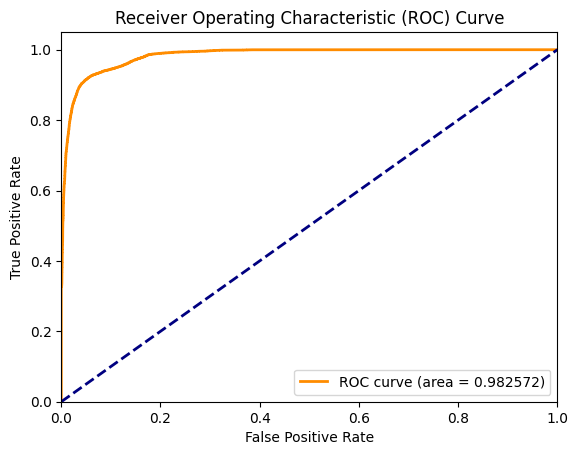

Train set: 122623
Test set: 40874
Epoch [1/10000], Loss: 0.1566
Test Accuracy: 94.11%
AUC: 0.9816272547488278


C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:49: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_train, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(y_train, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_train, dtype=torch.double).to(device='cu

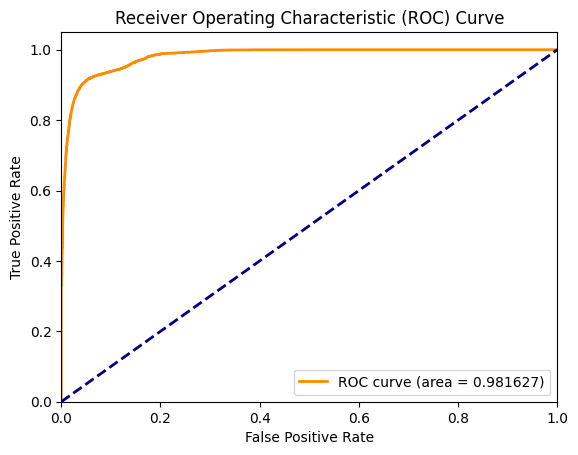

Train set: 122623
Test set: 40874
Epoch [1/10000], Loss: 0.1555
Test Accuracy: 93.98%
AUC: 0.9815944838664812


C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:49: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_train, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(y_train, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_train, dtype=torch.double).to(device='cu

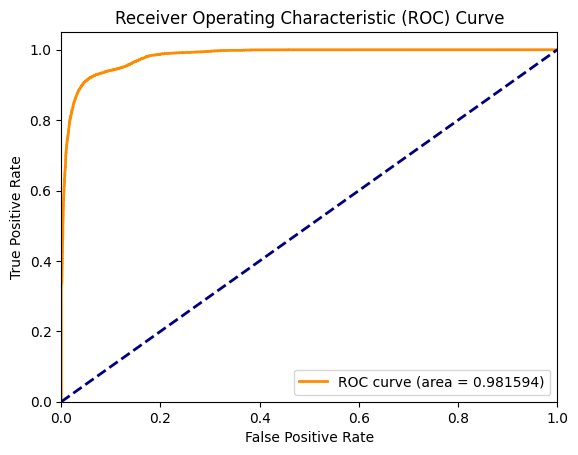

Train set: 122623
Test set: 40874
Epoch [1/10000], Loss: 0.1553
Test Accuracy: 93.84%
AUC: 0.9809383152825264


C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:49: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_train, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:50: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(y_train, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\1706906916.py:60: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_train, dtype=torch.double).to(device='cu

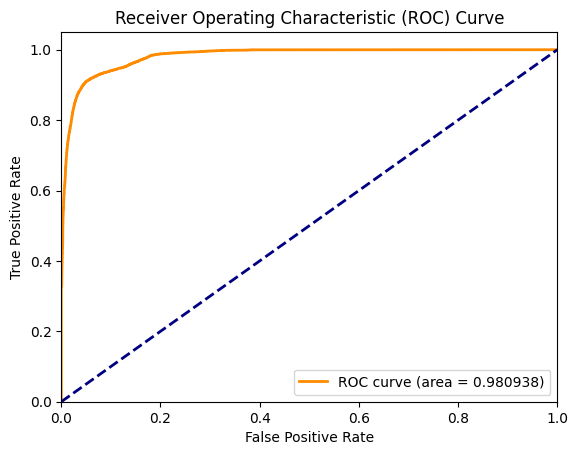

In [269]:
learning_rate = 3e-4 # 学习率

criterion = nn.BCELoss() # 损失函数选为二元交叉熵损失函数
# criterion = nn.HuberLoss()
num_epochs = 10000
learning_rate = 0.3

input_dim = 5
hidden_dim = 25
output_dim = 1

model = LogisticRegression_Up(input_dim,hidden_dim,output_dim)
optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)

# 初始化KFold对象，指定n_splits为4进行四重交叉验证
kf = KFold(n_splits=4, shuffle=True)

X = X_all
y = Y_all

X_all.to(device='cuda')
Y_all.to(device='cuda')
model.to(device='cuda')


# 对数据进行四重交叉验证
index = 0
for train_index, test_index in kf.split(X):
    index += 1

    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]
    y_train = y_train.reshape(-1,1)
    y_test = y_test.reshape(-1,1)
    X_train.to(device='cuda')
    X_test.to(device='cuda')
    y_train.to(device='cuda')
    y_test.to(device='cuda')
    # 在这里进行模型的训练和评估
    # 例如，您可以使用上面提到的逻辑斯特回归模型进行训练和评估
    # 打印训练集和测试集的大小
    print("Train set:", len(X_train))
    print("Test set:", len(X_test))



    # 开始训练

    inputs = torch.tensor(X_train, dtype=torch.double).to(device='cuda')
    labels = torch.tensor(y_train, dtype=torch.double).to(device='cuda')

    optimizer.zero_grad()
    outputs = model(inputs).to(device='cuda')
    loss = criterion(outputs, labels)
    loss.backward()
    optimizer.step()
    loss_temp = loss.item()

    for epoch in range(num_epochs):
        inputs = torch.tensor(X_train, dtype=torch.double).to(device='cuda')
        labels = torch.tensor(y_train, dtype=torch.double).to(device='cuda')

        optimizer.zero_grad()
        outputs = model(inputs).to(device='cuda')
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        if epoch%100 ==0:
            print('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, loss.item()))
        if np.abs(loss.item()-loss_temp)<0.0001:
            break


# UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
#   inputs = torch.tensor(X_train, dtype=torch.double).to(device='cuda')

    # 评估模型
    with torch.no_grad():
        inputs = torch.tensor(X_test, dtype=torch.double).to(device='cuda')
        labels = torch.tensor(y_test, dtype=torch.double).to(device='cuda')
        outputs = model(inputs).to(device='cuda')
        predicted = (outputs > 0.5).float().to(device='cuda')
        accuracy = (predicted == labels).sum().item() / len(labels)


        print('Test Accuracy: {:.2f}%'.format(accuracy * 100))

        # 计算ROC曲线
        fpr, tpr, thresholds = roc_curve(labels.to(device='cpu'), outputs.to(device='cpu'))

        # 计算AUC
        roc_auc = auc(fpr, tpr)
        print('AUC:',roc_auc)

        # 绘制ROC曲线
        plt.figure()
        plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.6f)' % roc_auc)
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic (ROC) Curve')
        plt.legend(loc="lower right")
        plt.savefig(r'./temp/v2/'+f'{index}.png')
        plt.show()


### 检验集

In [270]:
drug_object_rubbish = ['DB01263', 'DB00196', 'DB01167' ,'DB00582', 'DB00681']
drug_object_rubbish = [x.lower() for x in drug_object_rubbish]
drug_object_rubbish

['db01263', 'db00196', 'db01167', 'db00582', 'db00681']

In [291]:
X_all = []
y_all = []

for index, ID_main in enumerate(dict_DDI):

    for jndex, ID_object in enumerate(dict_DDI[ID_main]):
        if ID_object not in drug_object_rubbish:
            continue
        features_temp = [SS_1[index][jndex], result_inputs[0][index][jndex], result_inputs[1][index][jndex], result_inputs[2][index][jndex], result_inputs[0][index][jndex]]
        X_all.append(features_temp)
        y_all.append(1)

for index, ID_main in enumerate(dict_non_DDI):

    for jndex, ID_object in enumerate(dict_non_DDI[ID_main]):
        if ID_object not in drug_object_rubbish:
            continue
        features_temp = [SS_0[index][jndex], result_inputs[4][index][jndex], result_inputs[5][index][jndex], result_inputs[6][index][jndex], result_inputs[7][index][jndex]]
        X_all.append(features_temp)
        y_all.append(0)     

In [ ]:
print(len(X_all))
for i in range(len(X_all)):
    print(len(X_all[i]))

In [289]:
X_all = torch.tensor(X_all,dtype=torch.double)
Y_all = torch.tensor(y_all,dtype=torch.double)
Y_all = Y_all.reshape(-1,1)

Test Accuracy: 88.67%
AUC: 0.953943833943834


C:\Users\26613\AppData\Local\Temp\ipykernel_42940\666842790.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_all, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\666842790.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(Y_all, dtype=torch.double).to(device='cuda')


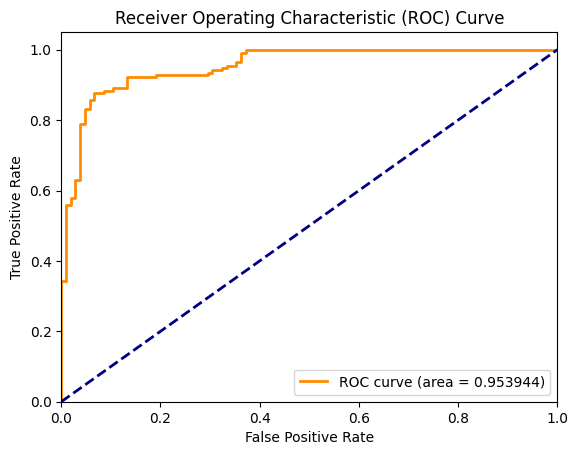

In [290]:
with torch.no_grad():
    inputs = torch.tensor(X_all, dtype=torch.double).to(device='cuda')
    labels = torch.tensor(Y_all, dtype=torch.double).to(device='cuda')

    outputs = model(inputs).to(device='cuda')
    predicted = (outputs > 0.5).float().to(device='cuda')
    accuracy = (predicted == labels).sum().item() / len(labels)


    print('Test Accuracy: {:.2f}%'.format(accuracy * 100))

    # 计算ROC曲线
    fpr, tpr, thresholds = roc_curve(labels.to(device='cpu'), outputs.to(device='cpu'))

    # 计算AUC
    roc_auc = auc(fpr, tpr)
    print('AUC:',roc_auc)

    # 绘制ROC曲线
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.6f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.savefig(r'./temp/detect_roc.png')
    plt.show()

# 计算药物列表和其概率比较

In [ ]:
table = pd.DataFrame()

In [321]:
print(drug_object_rubbish)
for drug in drug_object_rubbish:
    print(drug)

    X_all = []
    y_all = []
    ID_main_all = []
    for index, ID_main in enumerate(dict_DDI):
        for jndex, ID_object in enumerate(dict_DDI[ID_main]):
            if ID_object != drug:
                continue
            
            features_temp = [SS_1[index][jndex], result_inputs[0][index][jndex], result_inputs[1][index][jndex], result_inputs[2][index][jndex], result_inputs[0][index][jndex]]
            X_all.append(features_temp)
            y_all.append(1)
            ID_main_all.append(ID_main)

    for index, ID_main in enumerate(dict_non_DDI):
        for jndex, ID_object in enumerate(dict_non_DDI[ID_main]):
            if ID_object != drug:
                continue
            features_temp = [SS_0[index][jndex], result_inputs[4][index][jndex], result_inputs[5][index][jndex], result_inputs[6][index][jndex], result_inputs[7][index][jndex]]
            X_all.append(features_temp)
            y_all.append(0)
            ID_main_all.append(ID_main)
    
    X_all = torch.tensor(X_all,dtype=torch.double)
    Y_all = torch.tensor(y_all,dtype=torch.double)

    X_all = X_all.reshape((-1,1,5))
    Y_all = Y_all.reshape((-1,1))
    
    with torch.no_grad():
        inputs = torch.tensor(X_all, dtype=torch.double).to(device='cuda')
        labels = torch.tensor(Y_all, dtype=torch.double).to(device='cuda')
        
        outputs = model(inputs).to(device='cuda')
        predicted = (outputs > 0.5).float().to(device='cuda')
    # print(outputs, predicted)
    
    temp = pd.DataFrame(
        {'ID_main' : ID_main_all,
        'Label' : Y_all.flatten().tolist(),
        'Outputs' : outputs.flatten().tolist(),
        'Predicted' : predicted.flatten().tolist(),
        }
    )
    temp.sort_values(by="Outputs",inplace=True, ascending=False)
    table_name = drug.upper() + '.xlsx'
    temp.to_excel(os.path.join(cjy_path,'temp/v2/' + table_name),
                  sheet_name = 'Sheet1',
                  float_format = '%.10f',
                  na_rep = 'Loss',
                  index = False,
                  )

['db01263', 'db00196', 'db01167', 'db00582', 'db00681']
db01263
db00196
db01167


C:\Users\26613\AppData\Local\Temp\ipykernel_42940\3991613317.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = torch.tensor(X_all, dtype=torch.double).to(device='cuda')
C:\Users\26613\AppData\Local\Temp\ipykernel_42940\3991613317.py:35: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(Y_all, dtype=torch.double).to(device='cuda')


db00582
db00681


In [316]:
drug.upper() + '.xlsx'

'DB00681.xlsx'

# 4 多层感知机-d2l

In [ ]:
import d2l

In [ ]:
input_dim = 5
hidden_dim = 20
output_dim = 1
net = nn.Sequential(nn.Linear(input_dim, hidden_dim),
                    nn.ReLU(),
                    nn.Linear(hidden_dim, output_dim))

def init_weight(m):
    if type(m) == nn.Linear:
        nn.init.normal_(m.weight, std=0.01)
net.apply(init_weight)

In [ ]:
batch_size, lr, num_epochs = 256, 0.1, 10
loss = nn.CrossEntropyLoss(reduction='none')
trainer = torch.optim.SGD(net.parameters(), lr=lr)

train_iter, test_iter = d2l.load_data_fashion_mnist(batch_size)
d2l.train_ch3(net, train_iter, test_iter, loss, num_epochs, trainer)